Comparing the results of the map fits to the 1D rotation curve fits.  In general, I will be using the average velocity fits, since the majority of galaxies used this fit for their "good" fit.

In [1]:
from astropy.table import Table

import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib notebook

## Data

In [2]:
data_filename = '../spirals/Pipe3D-master_file_vflag_BB_minimize_chi10_smooth2p27_mapFit_N2O2_noWords.txt'

data = Table.read(data_filename, format='ascii.commented_header')

In [9]:
data.show_in_notebook()

idx,MaNGA_plate,MaNGA_IFU,NSA_plate,NSA_fiberID,NSA_MJD,NSA_index,NSA_RA,NSA_DEC,NSA_ba,NSA_phi,NSA_redshift,NSA_Mstar,vflag,avg_v_max,avg_v_max_sigma,avg_alpha,avg_alpha_sigma,avg_chi_square_rot,pos_v_max,pos_v_max_sigma,pos_alpha,pos_alpha_sigma,pos_chi_square_rot,neg_v_max,neg_v_max_sigma,neg_alpha,neg_alpha_sigma,neg_chi_square_rot,center_flux,center_flux_error,Mtot,Mtot_error,Mdark,Mdark_error,Mstar,Mdark_Mstar_ratio,Mdark_Mstar_ratio_error,rabsmag,avg_r_turn,avg_r_turn_sigma,pos_r_turn,pos_r_turn_sigma,neg_r_turn,neg_r_turn_sigma,logNO,t3,BPT,curve_used,points_cut,avg_chi_square_ndf,pos_chi_square_ndf,neg_chi_square_ndf,index,Z12logOH,u_r,frac_masked_spaxels,Rmax,Mtot_Mstar_ratio,Mtot_Mstar_ratio_error,smoothness_score,pos_Vmax_data,avg_Vmax_data,neg_Vmax_data,ba_map,ba_err_map,phi_map,phi_err_map,Vsys_map,Vsys_err_map,x0_map,x0_err_map,y0_map,y0_err_map,Vmax_map,Vmax_err_map,alpha_map,alpha_err_map,Rturn_map,Rturn_err_map,M90_map,M90_err_map,Sigma_disk_map,Sigma_disk_err_map,Rdisk_map,Rdisk_err_map,M90_disk_map,M90_disk_err_map,DRP_map_smoothness,NSA_elpetro_th90,chi2_map,chi2_disk_map,logHI,WF50,WP20,CMD_class
0,8466,6101,1438,139,53054,294037,168.0940308708338,44.81603706485203,0.6000820994377136,22.0548095703125,0.12233314663171768,144223535104.0,-9.0,574.8512281341687,9.095951605839385,1.7903772885769094,0.23250158624860973,64.50345321473802,979.0377448547318,7.095000328501162,2.0965763839938587,0.1977960838872132,30.863088739261528,167.6048904583456,1.6829306878660513,100.0,115.95561429702688,390.70777030309875,0.08372113108634949,0.00163589562924352,4358832534297.054,63176227074.445984,4059002308232.0713,63176227074.445984,299830226064.98267,13.537668838472468,0.21070666524713122,-22.167272567749023,1.4791260912861077,0.16907432810428674,1.41653521033679,0.2055252777876183,7.023474328427643,0.06357492840470455,-99.0,-99.0,2.0,-99,4,16.125863303684504,7.715772184815382,97.67694257577469,1238750,-99.0,2.598399519920349,0.08690404345202173,19.55835846649855,14.537668838472468,0.21070666524713122,2.15120792325884,1349.5788827920555,740.5274722782723,302.02938662785806,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,2.7228117884257457,0.1940942375548099,11.26042936714101,13.750839171898207,2.4065669724921217,11.610634803771973,-99.0,60523723.058375955,-99.0,-99.0,-99.0,3
1,10001,12704,483,456,51924,59044,133.98996686918764,57.677967666915094,0.15000000596046448,81.21926879882812,0.014121513813734055,4286639360.0,2.0,131.01025240011285,19.676026158251116,2.8987493963655893,0.9320010517634041,10.561579728586807,167.36819730056942,55.37941486751162,1.5603496124473835,0.7384203259825936,47.04399759256833,114.38748951090233,2.066567760147777,11.186389689559748,5.360847852417152,33.66362235935509,0.04750613123178482,0.00122847675844281,13105279432.977133,3936483090.9370747,5510141659.441766,3936483090.9370747,7595137773.535367,0.7254827790802428,0.5182898860180557,-18.730289459228516,2.373751698007841,0.442445748488078,2.7436231797149664,0.8109164906414781,2.2338502327998295,0.0792251267877304,-99.0,-99.0,-99.0,0,0,0.8124292098912929,3.6187690455821793,2.5895094122580837,-1,-99.0,2.1984682977199554,0.2559453032104637,3.2839520528476394,1.7254827790802427,0.5182898860180557,1.4387059747053537,120.31707348143723,117.87988927383222,-6.000375169033698,0.2873065437686021,0.99862709547983,83.52336212753869,1.4386253097033284,-5.667819219383402,3.4110773360533138,37.52377384812276,0.543991117586326,39.04025622123878,0.8436692728294988,-99.0,-99.0,0.927264729352485,0.8586696638787076,-99.0,-99.0,11.00204159996825,11.277332280936275,-99.0,-99.0,1.0806885517253293,0.023583319463693266,9.95438400669585,11.847215121786643,0.8818602095452142,33.156402587890625,15.738175199979842,35941367.32412297,-99.0,-99.0,-99.0,-1
2,8466,12705,1366,333,53063,272117,171.30192456278215,45.06676854548666,0.3019966185092926,7.65966796875,0.04525795951485634,7202819584.0,1.0,-1.0,-1.0,

In [5]:
bad_boolean = np.logical_or.reduce([data['M90_map'] == -99, 
                                    data['M90_disk_map'] == -99, 
                                    data['Vmax_map'] == -99, 
                                    data['Rturn_map'] == -99])

good_map_galaxies = data[~bad_boolean]

print(len(good_map_galaxies))

0


# Compare $\alpha$

<IPython.core.display.Javascript object>


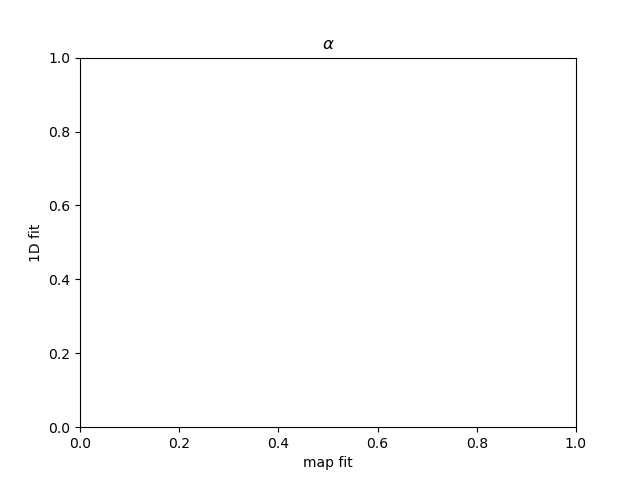

In [4]:
plt.figure()

plt.hist2d(good_map_galaxies['alpha_map'], 
           good_map_galaxies['avg_alpha'], 
           norm=mpl.colors.LogNorm(), bins=[15, 100])

plt.plot([0,0], [15,15], 'r', linewidth=5)

plt.title(r'$\alpha$')
plt.xlabel('map fit')
plt.ylabel('1D fit');

##### What is the distribution of $\alpha$ from the 1D fits for those objects with $\alpha = 15$ in the map fit?

<IPython.core.display.Javascript object>


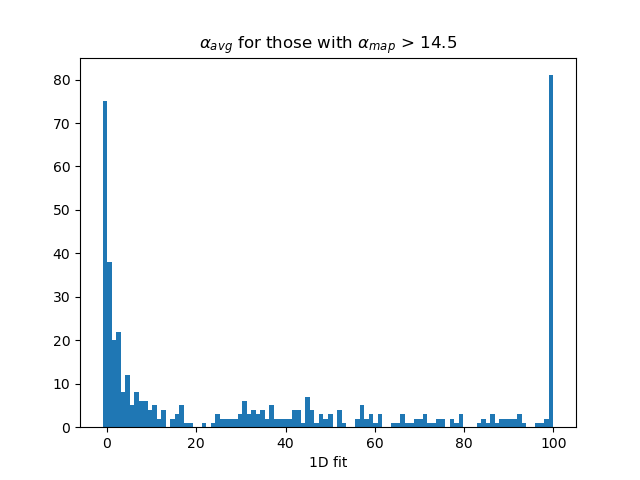

In [5]:
plt.figure()

plt.hist(good_map_galaxies['avg_alpha'][good_map_galaxies['alpha_map'] > 14.5], bins=100)

plt.title(r'$\alpha_{avg}$ for those with $\alpha_{map}$ > 14.5')
plt.xlabel('1D fit');

##### What is the distribution in $V_{mas}$ and $R_{turn}$ for those objects with $\alpha = 15$ in the map fit?

<IPython.core.display.Javascript object>


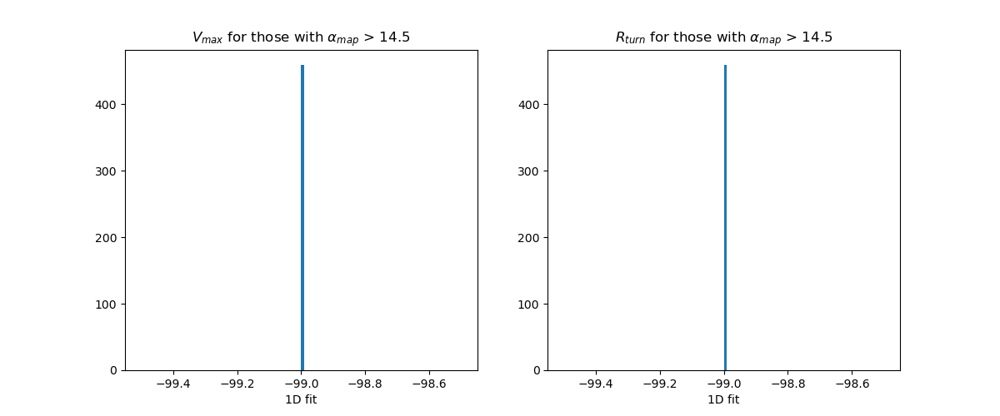

In [6]:
plt.figure(figsize=(12,5))

plt.subplot(121)
plt.hist(good_map_galaxies['Vmax_map'][good_map_galaxies['alpha_map'] > 14.5], bins=100)

plt.title(r'$V_{max}$ for those with $\alpha_{map}$ > 14.5')
plt.xlabel('1D fit')


plt.subplot(122)
plt.hist(good_map_galaxies['Rturn_map'][good_map_galaxies['alpha_map'] > 14.5], bins=100)

plt.title(r'$R_{turn}$ for those with $\alpha_{map}$ > 14.5')
plt.xlabel('1D fit');